# importing libraries

In [1]:
#basic import
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# import data

In [2]:
train_df = pd.read_csv('train_ps_s4e1.csv')
test_df = pd.read_csv('test_ps_s4e1.csv')

In [4]:
train_df.head()
#numerical - CreditScore,Age,Balance,EstimatedSalary
#categorical - gender,geography,tenure,numofproducts,hascrcard,isactive
#target-Exited

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [5]:
train_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,165034.0,8.251650e+04,47641.356500,0.00,41258.25,82516.5,1.237748e+05,165033.00
CustomerId,165034.0,1.569201e+07,71397.816791,15565701.00,15633141.00,15690169.0,1.575682e+07,15815690.00
CreditScore,165034.0,6.564544e+02,80.103340,350.00,597.00,659.0,7.100000e+02,850.00
Age,165034.0,3.812589e+01,8.867205,18.00,32.00,37.0,4.200000e+01,92.00
Tenure,165034.0,5.020353e+00,2.806159,0.00,3.00,5.0,7.000000e+00,10.00
Balance,165034.0,5.547809e+04,62817.663278,0.00,0.00,0.0,1.199395e+05,250898.09
NumOfProducts,165034.0,1.554455e+00,0.547154,1.00,1.00,2.0,2.000000e+00,4.00
HasCrCard,165034.0,7.539537e-01,0.430707,0.00,1.00,1.0,1.000000e+00,1.00
IsActiveMember,165034.0,4.977702e-01,0.499997,0.00,0.00,0.0,1.000000e+00,1.00
EstimatedSalary,165034.0,1.125748e+05,50292.865585,11.58,74637.57,117948.0,1.551525e+05,199992.48


In [6]:
#no null values
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


# Profile Report

In [13]:
from ydata_profiling import ProfileReport
rep = ProfileReport(train_df)
rep

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
#correlation with target
sns.set_style('white')
train_df.select_dtypes(include='number').corr()['Exited'].sort_values(ascending=False).drop('Exited').plot(kind='bar')
#no strong correlations seen

<Axes: >

# ft engineering surname column

In [9]:
#making use of the surname column by mapping each name to a number
train_df['Surname'].describe()

count     165034
unique      2797
top         Hsia
freq        2456
Name: Surname, dtype: object

In [10]:
test_df['Surname'].describe()

count     110023
unique      2708
top         Hsia
freq        1606
Name: Surname, dtype: object

In [3]:
#it has 2797 unique values
unique_surnames_train = list(train_df['Surname'].unique())

In [4]:
unique_surnames_test = list(test_df['Surname'].unique())

In [5]:
map_d_train = {unique_surnames_train[i]:i for i in range(len(unique_surnames_train))}

In [6]:
map_d_test = {unique_surnames_test[i]:i for i in range(len(unique_surnames_test))}

In [15]:
map_d_train

{'Okwudilichukwu': 0,
 'Okwudiliolisa': 1,
 'Hsueh': 2,
 'Kao': 3,
 'Chiemenam': 4,
 'Genovese': 5,
 "Ch'ang": 6,
 'Chukwuebuka': 7,
 'Manna': 8,
 'Cattaneo': 9,
 'Fokine': 10,
 'Chiu': 11,
 'Rossi': 12,
 "Ts'ai": 13,
 'Chukwuemeka': 14,
 'Tung': 15,
 'Macdonald': 16,
 'Esquivel': 17,
 'Hargreaves': 18,
 "Ts'ui": 19,
 'Udegbulam': 20,
 'Nnachetam': 21,
 'Trentini': 22,
 'Akabueze': 23,
 'Obidimkpa': 24,
 'Sazonova': 25,
 'Vasilieva': 26,
 'Shih': 27,
 'Chidubem': 28,
 'Yermolayev': 29,
 'L?': 30,
 'Kumm': 31,
 'Okonkwo': 32,
 "Ch'ien": 33,
 'Panicucci': 34,
 'Walker': 35,
 'Lucchesi': 36,
 'Kenniff': 37,
 'Ting': 38,
 'Hs?': 39,
 'Hsia': 40,
 'Mamelu': 41,
 'Ibezimako': 42,
 'Chiekwugo': 43,
 "Ch'iu": 44,
 'McNeill': 45,
 'Johnston': 46,
 'Chubb': 47,
 'Aksenov': 48,
 "T'ien": 49,
 'Onyekachi': 50,
 'Omeokachie': 51,
 'Nkemakolam': 52,
 'Porter': 53,
 'Goliwe': 54,
 'Su': 55,
 'Nkemakonam': 56,
 'Mazzi': 57,
 'Shao': 58,
 'Macfarlan': 59,
 'Calabrese': 60,
 'Nwachukwu': 61,
 "T'an": 62

In [7]:
train_df['Surname'] = train_df['Surname'].replace(map_d_train)

In [8]:
test_df['Surname'] = test_df['Surname'].replace(map_d_test)

In [18]:
test_df['Surname'].describe()

count    110023.000000
mean        407.128564
std         479.765484
min           0.000000
25%          84.000000
50%         235.000000
75%         534.000000
max        2707.000000
Name: Surname, dtype: float64

# Visualizations

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


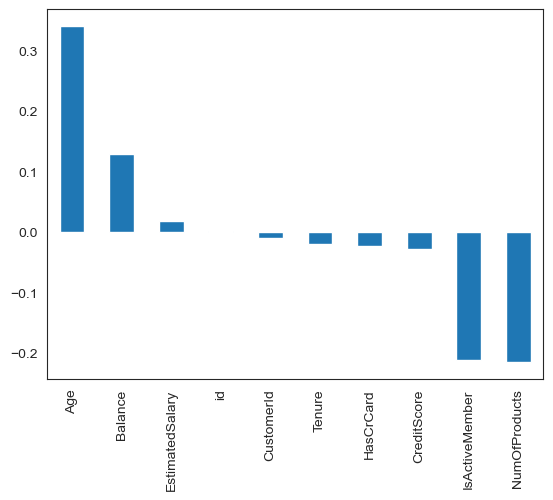

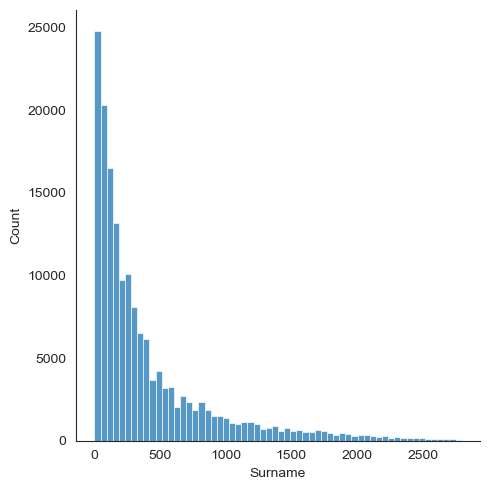

In [19]:
%matplotlib inline
sns.displot(x='Surname',data=train_df,bins=60)
#now surname values are from 0 to 2797 which caan be used by algorithm

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


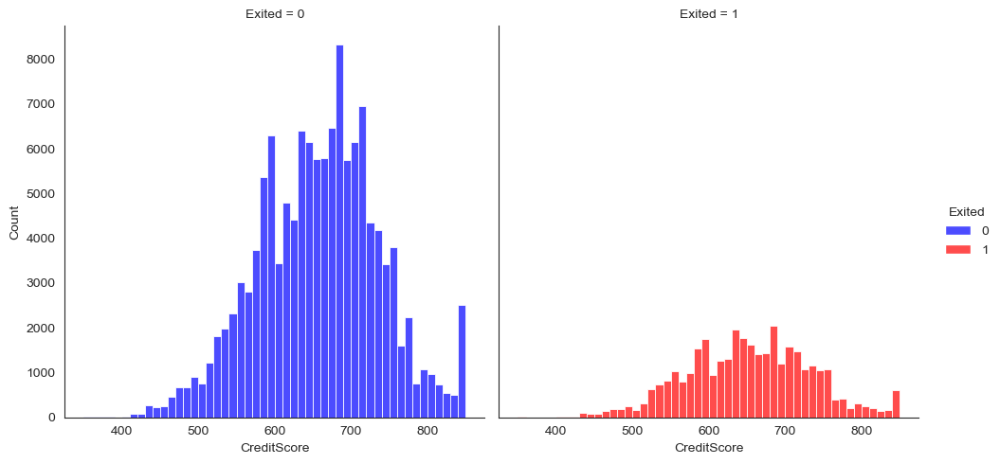

In [20]:
#credit score
%matplotlib inline
facet_kws = {"hue":'Exited','palette':{0:'blue',1:'red'}}
sns.displot(x='CreditScore',data=train_df,bins=50,**facet_kws,alpha=0.7,col='Exited')
#people who have not exited have a higher credit score

<Axes: xlabel='Exited', ylabel='count'>

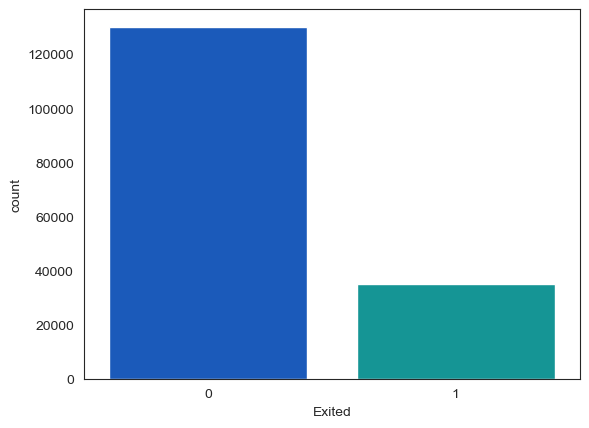

In [21]:
#target itself
sns.countplot(x='Exited',data=train_df,palette='winter')
#uneven distribution

<Axes: xlabel='Geography', ylabel='count'>

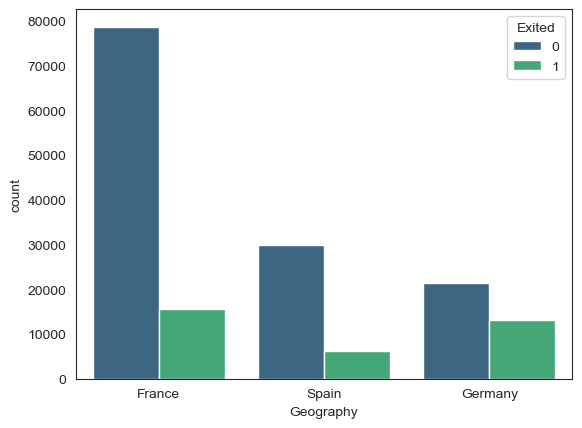

In [22]:
#geography
sns.countplot(x='Geography',data=train_df,palette='viridis',hue='Exited')
#ratio of not exited to exited is highest for france residences,and lowest for germany

<Axes: xlabel='Gender', ylabel='count'>

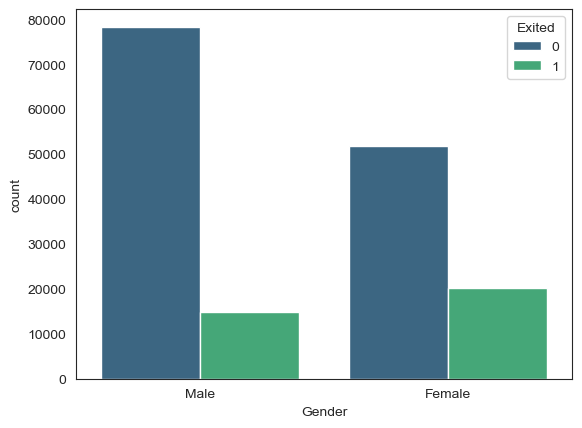

In [23]:
#gender
sns.countplot(x='Gender',data=train_df,palette='viridis',hue='Exited')

In [9]:
#converting categorical to numerical
cat_ft = ['Geography','Gender']
train_df = pd.get_dummies(train_df,columns=cat_ft,drop_first=True)
test_df = pd.get_dummies(test_df,columns=cat_ft,drop_first=True)

In [25]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   id                 165034 non-null  int64  
 1   CustomerId         165034 non-null  int64  
 2   Surname            165034 non-null  int64  
 3   CreditScore        165034 non-null  int64  
 4   Age                165034 non-null  float64
 5   Tenure             165034 non-null  int64  
 6   Balance            165034 non-null  float64
 7   NumOfProducts      165034 non-null  int64  
 8   HasCrCard          165034 non-null  float64
 9   IsActiveMember     165034 non-null  float64
 10  EstimatedSalary    165034 non-null  float64
 11  Exited             165034 non-null  int64  
 12  Geography_Germany  165034 non-null  bool   
 13  Geography_Spain    165034 non-null  bool   
 14  Gender_Male        165034 non-null  bool   
dtypes: bool(3), float64(5), int64(7)
memory usage: 15.6

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


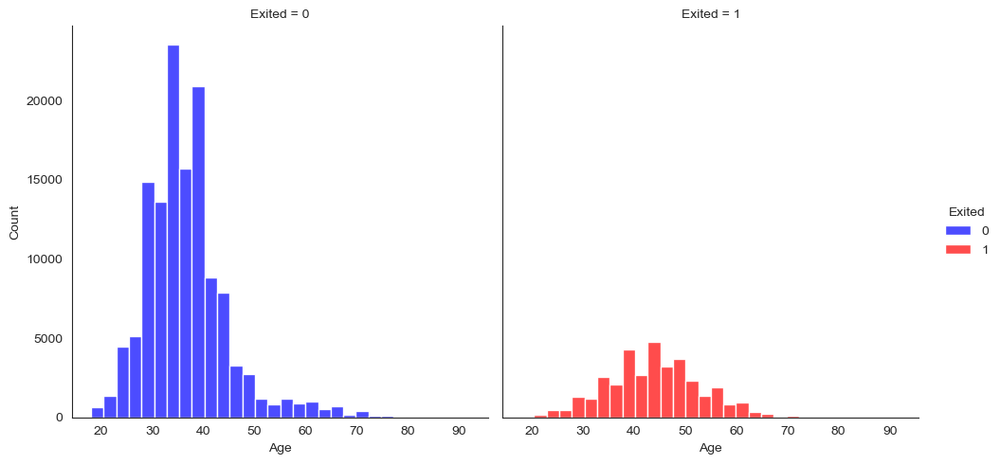

In [26]:
#age
sns.displot(x='Age',data=train_df,col='Exited',alpha=0.7,**facet_kws,bins=30)
#not exited age peaks in 30-40 while exited peaks in 40-50

<Axes: xlabel='Tenure', ylabel='count'>

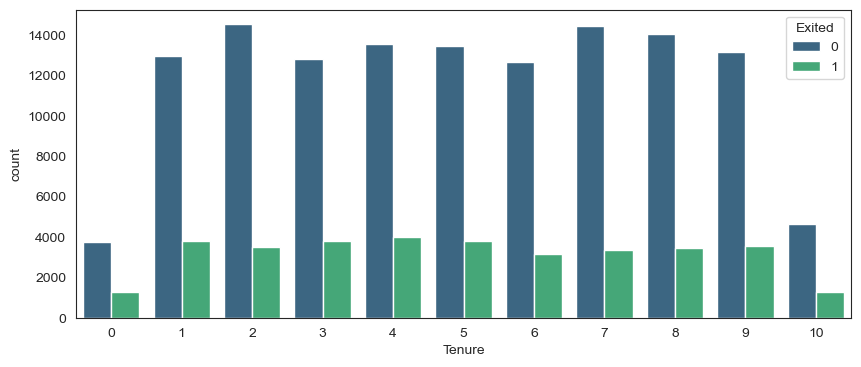

In [27]:
#tenure
plt.figure(figsize=(10,4))
sns.countplot(x='Tenure',data=train_df,palette='viridis',hue='Exited')
#except 0 and 10 all tenure values have similar distribution

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


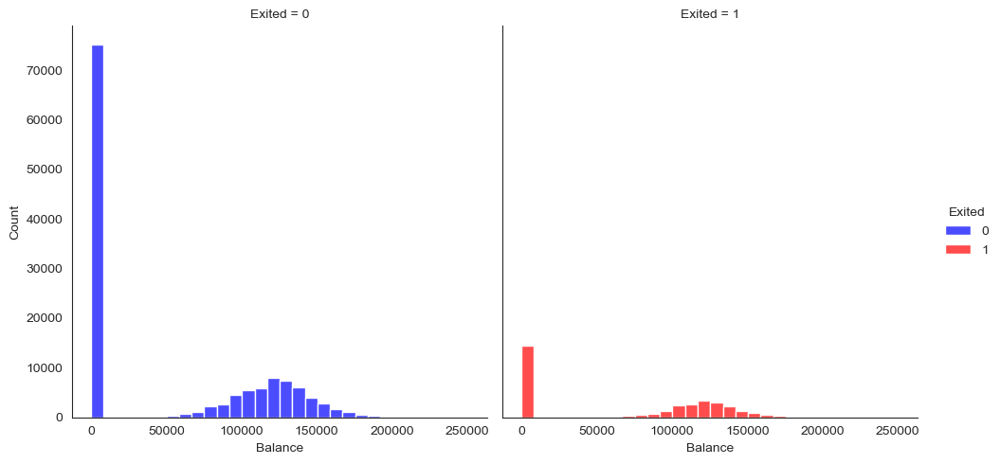

In [28]:
#balance
sns.displot(x='Balance',data=train_df,col='Exited',alpha=0.7,**facet_kws,bins=30)

<Axes: xlabel='NumOfProducts', ylabel='count'>

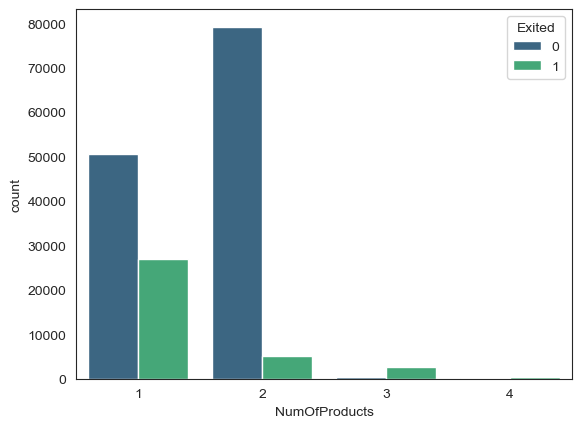

In [29]:
#numofproducts
sns.countplot(x='NumOfProducts',data=train_df,hue='Exited',palette='viridis')

<Axes: xlabel='HasCrCard', ylabel='count'>

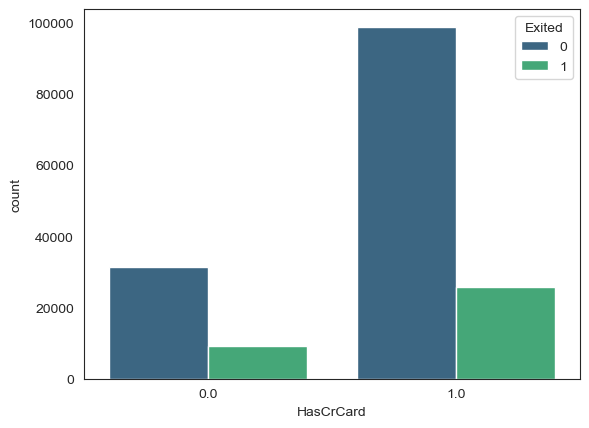

In [30]:
sns.countplot(x='HasCrCard',data=train_df,hue='Exited',palette='viridis')

<Axes: >

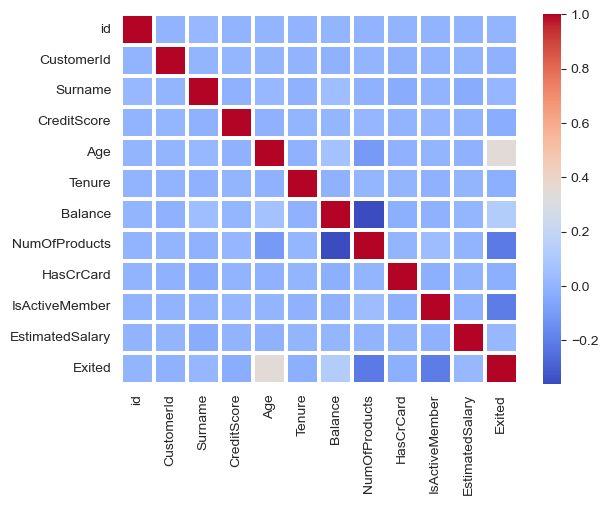

In [31]:
sns.heatmap(train_df.select_dtypes(include='number').corr(),cmap='coolwarm',linecolor='white',linewidths=1.5)

<Axes: xlabel='IsActiveMember', ylabel='count'>

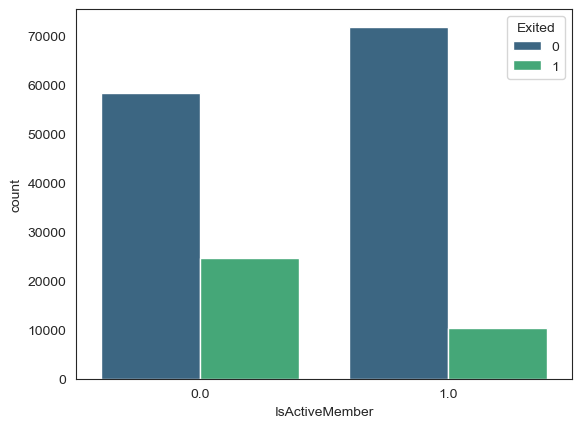

In [32]:
sns.countplot(x='IsActiveMember',data=train_df,hue='Exited',palette='viridis')

C:\Users\dines\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


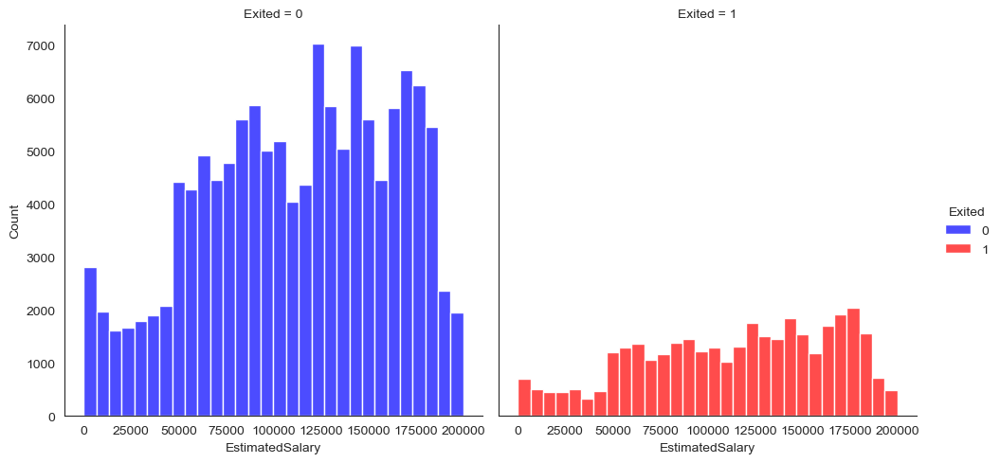

In [33]:
sns.displot(x='EstimatedSalary',data=train_df,col='Exited',alpha=0.7,**facet_kws,bins=30)

# dropping unnecessary columns

In [10]:
#now EDA is complete
train_df = train_df.drop(['id','CustomerId'],axis=1)
test_df = test_df.drop(['id','CustomerId'],axis=1)

# splitting data

In [11]:

X_train = train_df.drop('Exited',axis=1)
y_train = train_df['Exited']
X_test = test_df

# pre processing

In [12]:
#proprocessing
from sklearn.preprocessing import StandardScaler
sclr = StandardScaler()
X_train = sclr.fit_transform(X_train)
X_test = sclr.transform(X_test)

# MODEL TRAINING

In [ ]:
# 5 models -
# 1.Dtree , 2.RFC , 3.logistic regression, 4.SVM, 5.ANN

#  Decision Tree

In [37]:

from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
predictions_dtree = dtree.predict(X_test)

In [63]:
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_dtree = pd.DataFrame(predictions_dtree,columns=["Exited"])
pred_dtree = pd.concat([p_dtree,test_2["id"]],axis=1)
pred_dtree.set_index("id",inplace=True)
pred_dtree.to_csv("ps_s4e1_dtree_2.csv")

In [38]:
#hypertuning dtree model
#tuning
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
# Define the hyperparameter grid for RandomizedSearchCV
random_param_grid_dtree = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': np.arange(3, 15),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 6),
    'max_features': ['auto', 'sqrt', 'log2', None]
}

# Define the hyperparameter grid for GridSearchCV
grid_param_grid_dtree = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': np.arange(3, 15),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 6),
    'max_features': ['auto', 'sqrt', 'log2', None]
}
grid_dtree = GridSearchCV(dtree,grid_param_grid_dtree,verbose=3,cv=5)
rand_grid_dtree = RandomizedSearchCV(dtree,random_param_grid_dtree,n_iter=50,verbose=3)
grid_dtree.fit(X_train,y_train)
rand_grid_dtree.fit(X_train,y_train)

Fitting 5 folds for each of 8640 candidates, totalling 43200 fits
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_feat

[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=bes

[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter

[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=10, s

[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitt

[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitt

[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=r

[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=rando

[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.809 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.834 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.800 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.794 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=6

[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.795 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split

[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.793 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.791 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.806 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.798 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.797 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.796 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, 

[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.814 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.808 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.787 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.800 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.790 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.790 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.809 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.802 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.794 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.798 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, sp

[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.791 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.810 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.791 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.826 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split

[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.798 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.789 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.790 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.790 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.788 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.826 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.829 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.829 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.788 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.801 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.817 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.788 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.826 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.794 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=4

[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.791 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.808 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.791 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.785 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split

[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.826 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.788 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.800 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=6, sp

[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.798 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.836 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.833 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.832 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=3, 

[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.788 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.789 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.810 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=5, 

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.829 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.852 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.843 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=1, min_samples

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=7, 

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.810 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.822 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.810 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.808 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=9, 

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.808 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.815 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.815 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.818 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.805 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=2

[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.838 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.804 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split

[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=rando

[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=2, spli

[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitt

[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=r

[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=rando

[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitte

[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitt

[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.829 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.829 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.796 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.805 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.788 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, sp

[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.815 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.790 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.794 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.826 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.799 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.798 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.819 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.790 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.792 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.791 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.797 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.790 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.843 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.810 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.838 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=4

[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.847 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.824 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.834 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.802 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9

[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.796 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.788 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.830 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.795 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.834 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, 

[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.821 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.794 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.809 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.834 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.827 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.812 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.813 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.807 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, sp

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.797 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.801 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.805 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.827 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.830 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.838 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.788 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.803 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_s

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.811 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.802 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.791 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.814 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.841 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.820 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.837 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.799 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.789 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=3

[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.797 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.821 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.798 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.826 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.798 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=9, 

[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.812 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.801 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.799 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split

[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.795 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.840 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.831 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.830 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.828 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=2, s

[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.830 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.807 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.824 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.802 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.816 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.837 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=4, sp

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.822 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.831 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.818 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.828 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.830 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.844 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=6, 

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.837 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.840 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.830 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.834 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.822 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=8, 

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.850 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.845 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.820 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.847 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.838 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.844 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.828 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split

[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter

[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=10, s

[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=rando

[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitt

[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=rando

[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=10, spli

[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=r

[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.838 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.827 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.831 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.840 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.834 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.845 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, sp

[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.825 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.795 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.803 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.795 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.828 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.843 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.834 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.831 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.819 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.828 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, sp

[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.795 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.790 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.806 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.834 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.829 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3

[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.812 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.840 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.833 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.806 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.815 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.797 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.790 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.841 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.827 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.835 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.827 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.794 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.811 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_s

[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.805 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.818 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.817 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.809 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.823 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.851 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.838 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.838 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.807 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.806 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.809 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=3

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.793 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.798 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.826 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.832 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.838 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.836 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.810 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.816 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.808 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.808 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.819 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.823 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.830 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.837 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.805 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.795 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.811 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.827 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.828 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.842 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.833 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.832 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.843 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.815 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9

[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.817 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.807 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.791 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.840 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.843 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.822 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.860 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.853 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.854 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.835 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.841 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.852 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.856 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.857 total time=   0.5s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.853 total time=   0.6s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.855 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.852 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.851 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.846 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.842 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.840 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.860 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.853 total time=   0.6s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.857 total time=   0.5s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.844 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.827 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6

[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.826 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.849 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   0.5s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   0.5s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.860 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.853 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, 

[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.853 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.857 total time=   0.5s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.828 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.834 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split

[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.841 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.857 total time=   0.5s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.857 total time=   0.5s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.860 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.853 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, 

[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.853 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.856 total time=   0.5s
[CV 1/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.832 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.841 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.848 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.831 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=5, max_features=None, min_samples_leaf=5, min_samples

[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter

[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter

[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=rando

[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter

[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=b

[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=rando

[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=10, split

[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.830 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.845 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.834 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.819 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, sp

[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.829 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.830 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.836 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=3

[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.813 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.842 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.837 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.802 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.816 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.849 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.833 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.844 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.830 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.827 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.806 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.801 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_s

[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.813 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.824 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.828 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.830 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.819 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.829 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, 

[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.829 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.809 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.798 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.793 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split

[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.848 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.815 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.838 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.852 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.830 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.823 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, sp

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.828 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.836 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.837 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=6

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.830 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.842 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.845 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.812 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.809 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=2

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.824 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.811 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.809 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.849 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.837 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.842 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.817 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.823 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.846 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.791 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=4

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.807 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.812 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.824 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.842 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.839 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.829 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.839 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.813 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.803 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.800 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.822 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.821 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.853 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.833 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.845 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=3

[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.847 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.853 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.831 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.803 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.804 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.802 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.857 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.852 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.853 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.860 total time=   0.7s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.861 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.861 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.834 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.850 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_s

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.857 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.839 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.837 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.862 total time=   0.6s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.860 total time=   0.6s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.861 total time=   0.7s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.861 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.857 total time=   0.6s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.838 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.842 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.858 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=3

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.858 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.850 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.852 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.861 total time=   0.7s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.861 total time=   0.6s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=9

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.861 total time=   0.7s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.857 total time=   0.7s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.854 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.857 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.860 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=5

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.852 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.846 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.861 total time=   0.7s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.861 total time=   0.7s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_spli

[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.861 total time=   0.7s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.857 total time=   0.7s
[CV 5/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.849 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.848 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.860 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=7

[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter

[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, 

[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter

[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=rando

[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitte

[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitt

[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter

[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=10, s

[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.845 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.833 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.847 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.836 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, sp

[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.820 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.812 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.842 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.849 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=4

[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.848 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.820 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.843 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.813 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.811 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.799 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=9

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.834 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.847 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.835 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.843 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, sp

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.840 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.842 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.829 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.798 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.830 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.841 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.854 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.846 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.848 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, sp

[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.851 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.809 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.811 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.812 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.829 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.814 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.831 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.854 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.851 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.831 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.812 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split

[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.820 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.846 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.830 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.852 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.835 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.847 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.845 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.819 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.795 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=3

[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.842 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.853 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.838 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.842 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, sp

[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.836 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.810 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.823 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.828 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.855 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.853 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.841 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.846 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, sp

[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.828 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.851 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.844 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.846 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.846 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.839 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.829 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4

[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.808 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.836 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.849 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.834 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=

[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.862 total time=   0.8s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.845 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.859 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.864 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.856 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.863 total time=   0.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.865 total time=   0.7s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.861 total time=   0.8s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.862 total time=   0.8s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.853 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.856 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.858 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.843 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.832 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.863 total time=   0.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.865 total time=   0.8s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.861 total time=   0.8s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.862 total time=   0.8s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.858 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.849 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.853 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.852 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.855 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_sample

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.863 total time=   0.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.865 total time=   0.8s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.861 total time=   0.8s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.862 total time=   0.8s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.849 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=7, sp

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.853 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.859 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.854 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.852 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.863 total time=   0.8s
[CV 3/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.865 total time=   0.8s
[CV 4/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.861 total time=   0.8s
[CV 5/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.862 total time=   0.8s
[CV 1/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.858 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=9, sp

[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=bes

[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter

[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitte

[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=rando

[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=b

[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=ran

[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=10, spli

[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.846 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.842 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.839 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, sp

[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.852 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.815 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.813 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.845 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split

[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.849 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.843 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.845 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.811 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, 

[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.807 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.844 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.833 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.834 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.850 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.849 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.852 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.844 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_spl

[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.810 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.831 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.845 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.853 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7

[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.839 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.823 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3

[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.829 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.844 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.849 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.854 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.850 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, sp

[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.839 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.839 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.834 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.854 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.854 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.829 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, sp

[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.816 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.813 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.821 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.843 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.845 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8

[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.851 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.847 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.844 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.819 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.844 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.843 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.848 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.840 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.832 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.844 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.819 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.816 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.795 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.817 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.848 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.840 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.845 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.848 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=3, 

[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.843 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.840 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.816 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.816 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.828 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.852 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.856 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.865 total time=   1.0s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.862 total time=   0.9s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=5, 

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.856 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.853 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.854 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=1, min_samples

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.861 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.862 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.862 total time=   0.9s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.861 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=7, 

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.861 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.860 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.856 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.859 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.862 total time=   0.9s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=9, 

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.852 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.853 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.853 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.853 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.862 total time=   0.9s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=2

[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.860 total time=   0.9s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.861 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.848 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.860 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split

[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter

[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=r

[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitt

[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=rando

[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter

[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=r

[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=bes

[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.854 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_spl

[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.846 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, sp

[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.846 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.825 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.846 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.843 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.848 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.847 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.838 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.817 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, sp

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.818 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.843 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.847 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.855 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.821 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.817 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.819 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.856 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.849 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.857 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.833 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.837 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.815 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.855 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.809 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.851 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.842 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.838 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.849 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.844 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.848 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=8, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.840 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.834 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.849 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.840 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.850 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.844 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.842 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.815 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.829 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_spl

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.845 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.847 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.851 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.854 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.853 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=3, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.823 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.841 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.856 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.843 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.853 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=5, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.826 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.846 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.864 total time=   1.1s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_s

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.860 total time=   1.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.864 total time=   1.1s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.858 total time=   1.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.860 total time=   1.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=7, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.860 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.858 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.861 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.864 total time=   1.1s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.864 total time=   1.1s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.858 total time=   1.1s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.860 total time=   1.0s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=9, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.852 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.864 total time=   1.1s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.860 total time=   1.0s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.863 total time=   1.0s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.858 total time=   1.1s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.861 total time=   1.1s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.861 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=2, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.855 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.858 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.860 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.864 total time=   1.1s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.863 total time=   1.1s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.858 total time=   1.0s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.861 total time=   1.1s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.864 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=4, 

[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.864 total time=   1.1s
[CV 2/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.860 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_spl

[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitte

[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=5, s

[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=10

[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=8,

[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, spl

[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3,

[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitte

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.850 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.855 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.848 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.849 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.856 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samp

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.850 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.860 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.841 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.844 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.817 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.848 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.849 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.858 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.847 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.842 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.817 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.854 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_sa

[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.856 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.846 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.852 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.855 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.857 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.849 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.852 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.854 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.826 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.856 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.845 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.849 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.846 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.848 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.849 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.836 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.855 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.856 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.839 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.851 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.854 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.810 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.835 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.854 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=4, min_samp

[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.855 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.860 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.828 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.862 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.861 total time=   1.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.861 total time=   1.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.858 total time=   1.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.859 total time=   1.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.859 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.861 total time=   1.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.861 total time=   1.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   1.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.859 total time=   1.1s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.860 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.862 total time=   1.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.861 total time=   1.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.858 total time=   1.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.859 total time=   1.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.861 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.861 total time=   1.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.857 total time=   1.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.861 total time=   1.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.858 total time=   1.1s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.859 total time=   1.2s
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.864 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, split

[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, spl

[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=2, spl

[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, split

[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=5, s

[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=3,

[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=9,

[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.852 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.849 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.858 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.852 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.854 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_sa

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.854 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.848 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.833 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.856 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.849 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.845 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.844 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.818 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.853 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.854 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.840 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.854 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.847 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.848 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.855 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.849 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=1, min_samp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.841 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.848 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.832 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.831 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.856 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.846 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.851 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.849 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.850 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.829 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.852 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.849 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=4, min_samp

[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.826 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.854 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.845 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=log2, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.859 total time=   1.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.856 total time=   1.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.857 total time=   1.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.860 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.858 total time=   1.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.859 total time=   1.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.856 total time=   1.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.858 total time=   1.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.860 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.860 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.858 total time=   1.4s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.856 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_sa

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.858 total time=   1.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.856 total time=   1.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.858 total time=   1.3s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.861 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.862 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.861 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.857 total time=   1.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.856 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.859 total time=   1.3s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.856 total time=   1.3s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.857 total time=   1.4s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.861 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.860 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.857 total time=   1.3s
[CV 2/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.855 total time=   1.3s
[CV 3/5] END criterion=gini, max_depth=11, max_features=None, min_samples_leaf=5, min_sample

[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=3, spl

[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10,

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=6, s

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, split

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_spli

[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=7, split

[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=5, spl

[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.848 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.844 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.848 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.837 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.832 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.845 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.852 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.836 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.832 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.832 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.830 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.844 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.843 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.847 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.849 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.836 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.839 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.834 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.850 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.844 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.849 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.843 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samp

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.854 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.852 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.850 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.828 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.822 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.836 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.841 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.832 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.856 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.841 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.854 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.853 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.824 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.836 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.829 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.852 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_sa

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.848 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.849 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.843 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.832 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.845 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.844 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.847 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.842 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.856 total time=   1.5s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.851 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.851 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.855 total time=   1.4s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.853 total time=   1.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.854 total time=   1.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.856 total time=   1.4s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.851 total time=   1.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.851 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.855 total time=   1.5s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.853 total time=   1.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.854 total time=   1.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.861 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.856 total time=   1.4s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.851 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=3, min_samp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.852 total time=   1.4s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.856 total time=   1.5s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.852 total time=   1.5s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.854 total time=   1.5s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.861 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.854 total time=   1.4s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.852 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.851 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.855 total time=   1.5s
[CV 4/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.853 total time=   1.4s
[CV 5/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.854 total time=   1.4s
[CV 1/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_sp

[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitte

[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, split

[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=9, s

[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, split

[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=3,

[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitte

[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=6,

[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.847 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.845 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.849 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_spli

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.842 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.845 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.852 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.851 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.846 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.842 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.845 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.842 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.843 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.823 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.845 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.851 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.844 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.851 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.841 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.840 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.843 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.843 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.840 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.832 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.851 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.849 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.843 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.852 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.846 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.846 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.837 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.853 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.850 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.847 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.844 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.853 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.846 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.839 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.851 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.850 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.848 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.848 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.840 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.823 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.849 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_sa

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.853 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.844 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.846 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.847 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.832 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.844 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.844 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.855 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.852 total time=   1.6s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.850 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=1, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.849 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.849 total time=   1.6s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.849 total time=   1.6s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.848 total time=   1.6s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.853 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.858 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.854 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.852 total time=   1.6s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.850 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=2, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.850 total time=   1.5s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.849 total time=   1.5s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.849 total time=   1.6s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.849 total time=   1.5s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.852 total time=   1.6s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.849 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=3, min_samp

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.850 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.848 total time=   1.6s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.850 total time=   1.5s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.849 total time=   1.6s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.858 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.852 total time=   1.6s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.851 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_sample

[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.851 total time=   1.6s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.848 total time=   1.6s
[CV 4/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.850 total time=   1.6s
[CV 5/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.848 total time=   1.6s
[CV 1/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_sp

[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitte

[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=4,

[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=9, split

[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitte

[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=3, s

[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=9, split

[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=6, s

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.840 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.846 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.844 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.846 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.843 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.846 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.845 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.841 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.843 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.847 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.844 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.841 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.843 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.847 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.837 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.845 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.848 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.843 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.841 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.852 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.853 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.847 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.848 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.844 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.844 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.841 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.826 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.847 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.843 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.845 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.846 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.842 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.847 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.846 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.840 total time=   0.1s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.845 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=1, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.848 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.843 total time=   0.5s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.845 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.844 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.845 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.843 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.838 total time=   0.1s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.837 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.850 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.826 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.837 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.845 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.844 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.843 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.845 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.832 total time=   0.1s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.843 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.843 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.846 total time=   0.5s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.843 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.846 total time=   0.5s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.841 total time=   0.5s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.843 total time=   0.4s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.844 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.845 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.843 total time=   0.1s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.846 total time=   0.4s
[CV 2/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.844 total time=   0.4s
[CV 3/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.842 total time=   0.4s
[CV 4/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=gini, max_depth=14, max_features=log2, min_samples_leaf=5, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.846 total time=   1.8s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.844 total time=   1.8s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.858 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.852 total time=   0.2s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.854 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=1, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.852 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.853 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.848 total time=   1.8s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.846 total time=   1.7s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.845 total time=   1.7s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.847 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.847 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.846 total time=   1.7s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.855 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.852 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.854 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.854 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.850 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.852 total time=   0.3s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.848 total time=   1.7s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.845 total time=   1.7s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.845 total time=   1.7s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.847 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.847 total time=   1.8s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.846 total time=   1.7s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.854 total time=   0.3s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.853 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.855 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=3, min_

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.854 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.848 total time=   1.7s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.845 total time=   1.7s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.845 total time=   1.7s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.848 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_sp

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.848 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.846 total time=   1.7s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.3s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.855 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_sample

[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.853 total time=   0.2s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.855 total time=   0.2s
[CV 1/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.847 total time=   1.7s
[CV 2/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.845 total time=   1.8s
[CV 3/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.845 total time=   1.7s
[CV 4/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.848 total time=   1.7s
[CV 5/5] END criterion=gini, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_sp

[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=1, min_samples_

[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_sa

[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=3, min_sample

[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_

[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=4, min_

[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=auto, min_samples_leaf=5, min_samples_

[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.789 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.788 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.798 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.814 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.809 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.825 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.798 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.827 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.812 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.792 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.789 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.806 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.807 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.813 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=3, mi

[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.793 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.796 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.790 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.800 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.803 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.794 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.802 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.813 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.803 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.791 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.800 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.802 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.796 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.803 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.794 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=sqrt, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.827 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.819 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.794 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, 

[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.788 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.802 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.797 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.793 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_le

[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.798 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.813 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.795 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.808 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, 

[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.791 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.836 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.830 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.802 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.811 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.813 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.795 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.806 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.788 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=3

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.787 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.807 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.804 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.826 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.811 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, 

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.801 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.827 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.802 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.804 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.790 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.835 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.817 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.799 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=log2, min_samples_leaf=5, 

[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.800 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.819 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1

[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.845 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.819 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.849 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.812 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.842 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.840 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=3, 

[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.805 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.813 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4

[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.802 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.799 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.816 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.850 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.830 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.818 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=3, max_features=None, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=1, min_sample

[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=2, min_samp

[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=3, min_sa

[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=4, min_samples_sp

[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_sa

[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=auto, min_samples_leaf=5, min_samp

[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.795 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.790 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.803 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.826 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.834 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.797 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.824 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.790 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.790 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.803 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.803 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samp

[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.843 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.811 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.841 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.851 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.797 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.832 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.796 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.791 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.791 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.796 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.793 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.796 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.821 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.822 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.841 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=3, mi

[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.804 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.842 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.795 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.810 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.788 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.813 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.817 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.799 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.825 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.832 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.844 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.790 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=sqrt, min_samples_leaf=5

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.801 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.798 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.826 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.806 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.824 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.845 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.830 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.829 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.801 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.793 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.793 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=1

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.789 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.795 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.802 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.837 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.849 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.829 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=2

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.790 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.799 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.811 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.788 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.794 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.811 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.795 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.831 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.820 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=3

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.826 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.798 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.816 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.801 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.792 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.797 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.806 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.810 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.841 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_lea

[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.818 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.831 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.794 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.795 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.793 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=log2, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.837 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.806 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.841 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.836 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.851 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.852 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.843 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.824 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.813 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.825 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.843 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.850 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.828 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.851 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.829 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.817 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.835 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.831 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.841 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.852 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.852 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.831 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.852 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.836 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.829 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.843 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.817 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.821 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.836 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.854 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=4, max_features=None, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=1, min_sa

[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_sp

[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, m

[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=3, min_samples_

[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=4, min_samples_

[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samp

[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=auto, min_samples_leaf=5, min_samples_

[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.821 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.822 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.830 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.803 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.806 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.804 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1

[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.817 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.809 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.834 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.842 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.811 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.813 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.840 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.827 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.829 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.801 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=2, 

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.813 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.808 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.800 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.816 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.841 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.829 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.837 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.833 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.838 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.824 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=3, mi

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.800 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.815 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.810 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.804 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.833 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.807 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.843 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.845 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.840 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.824 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.816 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.816 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.800 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.808 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.808 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.815 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.832 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.840 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.818 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.822 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.836 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.822 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.838 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.812 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.792 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.800 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.806 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.850 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.825 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.800 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=2, 

[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.829 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.817 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.799 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.806 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.819 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.789 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.794 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.800 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.831 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.814 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.820 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=3

[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.807 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.842 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.834 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.797 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.801 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4

[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.810 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.806 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.820 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.805 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.835 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.804 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.845 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.791 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.829 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.796 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.844 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.823 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, 

[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.853 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.841 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=1

[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.841 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.842 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.842 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.830 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.838 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.850 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.841 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.830 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.839 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.817 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.836 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, 

[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.853 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.844 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.843 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=4

[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.851 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.851 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.834 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.841 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 3/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.860 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.855 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.857 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.844 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=5, max_features=None, min_samples_leaf

[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=1, min_samples_

[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_sample

[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=2, min_

[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=3, min_samples_

[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_sample

[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=4, min_samp

[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=auto, min_samples_leaf=5, min_sa

[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.843 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.840 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.834 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.840 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.847 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.806 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.849 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.829 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.805 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.812 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.809 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.843 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.842 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.843 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.846 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.827 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.842 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.797 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.828 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.830 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.809 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.821 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.814 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.820 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.831 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.824 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.804 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=3, mi

[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.833 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.808 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.811 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.817 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.843 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.843 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.835 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.846 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.848 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf

[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.843 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.806 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.811 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.808 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.798 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.803 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.843 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.848 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.833 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.825 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.833 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, mi

[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.837 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.832 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.802 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.810 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.801 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.848 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.853 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.825 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.843 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.830 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.828 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.834 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_le

[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.809 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.808 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.816 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.846 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.849 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.842 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.835 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.849 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.848 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.841 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.825 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.821 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, 

[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.807 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.805 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.845 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.841 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.814 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.833 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.809 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.849 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.826 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.805 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.834 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.804 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.811 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samp

[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.850 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.841 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.860 total time=   0.7s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.864 total time=   0.7s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=1, 

[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.864 total time=   0.7s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.846 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.847 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.860 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.842 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.853 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.847 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.846 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.860 total time=   0.7s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.860 total time=   0.8s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.864 total time=   0.7s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.854 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, mi

[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.858 total time=   0.7s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.847 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.844 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.849 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.844 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.841 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samp

[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.851 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.860 total time=   0.7s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.864 total time=   0.7s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.858 total time=   0.8s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=4, mi

[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.859 total time=   0.8s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.848 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.850 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.847 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.853 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.849 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.837 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.862 total time=   0.7s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.860 total time=   0.7s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.864 total time=   0.7s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.860 total time=   0.7s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=None, min_samples_leaf=5, 

[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=1, min_samples_sp

[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_sa

[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=2, min_samples_

[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=3, min_samp

[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samp

[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=4, min_sampl

[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=auto, min_samples_leaf=5, min_sa

[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.840 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.828 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.844 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.848 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.845 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.819 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.844 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.814 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.804 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.817 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.829 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.850 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.836 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=2, 

[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.852 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.838 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.851 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.827 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.819 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.797 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.846 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.835 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.847 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.838 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.845 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.853 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.817 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.846 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.811 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.816 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.833 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.840 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.834 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=sqrt, min_samples_leaf=5, mi

[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.842 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.839 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.800 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.806 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.809 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.849 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.836 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.838 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=1, 

[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.838 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.837 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.836 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.804 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2

[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.830 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.810 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.857 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.835 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.839 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.849 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.851 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.845 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.838 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.799 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=3, 

[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.807 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.814 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.829 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.851 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.852 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.853 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.843 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.813 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.836 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.815 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.798 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.813 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.822 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.845 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.841 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.853 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.839 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.836 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=log2, min_samples_leaf=

[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.862 total time=   0.9s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.850 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.850 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.853 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.859 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.846 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.856 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.863 total time=   0.9s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.863 total time=   0.9s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.862 total time=   0.9s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.857 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.860 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=2, 

[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.854 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.847 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.862 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.847 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.855 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.865 total time=   0.8s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.857 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.863 total time=   0.9s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.862 total time=   0.8s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=

[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.862 total time=   0.9s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.860 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.852 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.853 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.852 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.845 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.857 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.865 total time=   0.9s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.863 total time=   0.9s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.863 total time=   0.9s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.865 total time=   0.9s
[CV 4/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.862 total time=   0.9s
[CV 5/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.862 total time=   0.9s
[CV 1/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.862 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.852 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=7, max_features=None, min_samples_leaf=5, 

[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=1, min_samp

[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_sample

[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_

[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_sa

[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=3, min_samp

[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=4, min_samples_sp

[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=auto, min_samples_leaf=5, min_sa

[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.842 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.851 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.852 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.836 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.851 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.845 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.854 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.813 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.843 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.832 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.854 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.842 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, 

[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.843 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.853 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.842 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.819 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.818 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.808 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.846 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.845 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.837 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.840 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.845 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.845 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.846 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.818 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.819 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_le

[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.807 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.837 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.855 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.839 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.849 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, mi

[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.846 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.847 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.826 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=sqrt, min_samples_leaf

[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.818 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.807 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.828 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.841 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.849 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.847 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=1

[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.834 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.851 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.852 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.842 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.828 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, 

[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.807 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.811 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.853 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.844 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.855 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.846 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.831 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.846 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.829 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, 

[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.803 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.850 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.846 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.854 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.850 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.852 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.826 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.847 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.819 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.825 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.820 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.848 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.849 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=log2, min_samples_leaf=5, 

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.865 total time=   1.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.861 total time=   1.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.861 total time=   1.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.858 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.858 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.858 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1

[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.851 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.855 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.854 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.858 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.865 total time=   1.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.862 total time=   1.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.865 total time=   1.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.862 total time=   1.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.865 total time=   1.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.861 total time=   1.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.861 total time=   1.1s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.859 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.861 total time=   1.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.852 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.849 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.854 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.860 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.863 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_le

[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.859 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.866 total time=   1.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.862 total time=   1.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.865 total time=   1.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.861 total time=   1.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=3, 

[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.865 total time=   1.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.861 total time=   1.1s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.861 total time=   1.1s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.857 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.861 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.856 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4

[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.855 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.853 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.859 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.856 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.866 total time=   1.0s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.862 total time=   1.1s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_le

[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.866 total time=   1.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.862 total time=   1.0s
[CV 3/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.865 total time=   1.0s
[CV 4/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.861 total time=   1.0s
[CV 5/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.861 total time=   1.0s
[CV 1/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.859 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=8, max_features=None, min_samples_leaf=5, mi

[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_

[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=1, min_sampl

[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=2, min_sa

[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=3, min_samples_sp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_

[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_

[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=auto, min_samples_leaf=5, min_sample

[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.851 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.845 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.828 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.825 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1

[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.813 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.837 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.849 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.820 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.856 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.841 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.848 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.854 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.853 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.826 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.842 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.843 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.833 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.843 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.818 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.821 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.841 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.841 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.857 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=3, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.846 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.853 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.849 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.813 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4

[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.819 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.820 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.855 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.839 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.853 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.851 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.847 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.858 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.838 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.818 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.817 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.818 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.844 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.824 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.849 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.854 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.843 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=1, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.856 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.839 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.852 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2

[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.823 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.823 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.846 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.847 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.844 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.840 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.855 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.854 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.848 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.811 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.815 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.817 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.843 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.842 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.851 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.857 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=4, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.848 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.847 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.840 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.828 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.850 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5

[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.822 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.829 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.808 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.852 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.849 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=log2, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.865 total time=   1.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.861 total time=   1.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.863 total time=   1.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.859 total time=   1.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.861 total time=   1.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.863 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.861 total time=   1.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.861 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.858 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.858 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.859 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.858 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.859 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.865 total time=   1.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.861 total time=   1.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.863 total time=   1.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.859 total time=   1.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=2, 

[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.863 total time=   1.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.859 total time=   1.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.861 total time=   1.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.860 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.859 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.865 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3

[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.865 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.856 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.865 total time=   1.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.861 total time=   1.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf

[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.865 total time=   1.3s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.861 total time=   1.3s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.863 total time=   1.3s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.859 total time=   1.3s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.861 total time=   1.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, mi

[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.861 total time=   1.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.856 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.860 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.857 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.856 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samp

[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.855 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.850 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.865 total time=   1.2s
[CV 2/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.861 total time=   1.2s
[CV 3/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.863 total time=   1.2s
[CV 4/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.858 total time=   1.2s
[CV 5/5] END criterion=entropy, max_depth=9, max_features=None, min_samples_leaf=5, 

[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, m

[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=1, m

[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=2,

[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=3, m

[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=4, min

[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min

[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=auto, min_samples_leaf=5, 

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.844 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.829 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=0.834 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_l

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.841 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.822 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.848 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.841 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.861 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.856 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.853 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.840 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=0.848 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.851 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.832 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.833 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.840 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.847 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.860 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.846 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.854 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.847 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.856 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.821 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.848 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.852 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=0.845 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.847 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.853 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.850 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.851 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=best;, score=0.855 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.860 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.821 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=0.829 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.847 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.829 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.859 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.849 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_sampl

[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.841 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.826 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.819 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.816 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.855 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=0.848 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.857 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.844 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.840 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=0.851 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=0.820 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.845 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.850 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.834 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.819 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.850 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.854 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10, splitter=best;, score=0.854 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_sampl

[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.853 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.853 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.808 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.820 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples_leaf=5, min_samples_split=6, splitter=random;, score=0.836 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.861 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.864 total time=   1.3s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.859 total time=   1.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.864 total time=   1.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.859 total time=   1.4s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.862 total time=   1.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.858 total time=   1.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=0.858 total time=   1.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.858 total time=   1.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.861 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.865 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.855 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.864 total time=   1.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.859 total time=   1.4s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.862 total time=   1.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=0.858 total time=   1.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_sampl

[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.862 total time=   1.3s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.858 total time=   1.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.858 total time=   1.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.860 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=3, min_samples_split=6, splitter=random;, score=0.860 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.859 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.858 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.861 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.863 total time=   1.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=best;, score=0.859 total time=   1.4s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.863 total time=   1.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.859 total time=   1.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.862 total time=   1.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.858 total time=   1.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=best;, score=0.858 total time=   1.3s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=0.852 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.858 total time=   1.4s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.861 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.863 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=random;, score=0.861 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.861 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.863 total time=   1.4s
[CV 2/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.857 total time=   1.3s
[CV 3/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.862 total time=   1.4s
[CV 4/5] END criterion=entropy, max_depth=10, max_features=None, min_samples_leaf=5, min_samples_split=10, splitter=best;, score=0.858 total time=   1.4s
[CV 5/5] END criterion=entropy, max_depth=10, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=1,

[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_s

[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=

[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=3, m

[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_s

[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=

[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=auto, min_samples_leaf=5, m

[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.848 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.847 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.846 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.850 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.854 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.854 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.827 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.815 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.849 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.834 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.854 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.847 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.853 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.852 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.851 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.824 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.826 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.846 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.849 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.859 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.854 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.835 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.836 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.825 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.858 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.853 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.852 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.851 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=2, splitter=random;, score=0.829 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.852 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.822 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.833 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.827 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.831 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.850 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.849 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.856 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.843 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.853 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.857 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.821 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.828 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.838 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.853 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.846 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.856 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.843 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   0.3s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.848 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.847 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.848 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.851 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.845 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.841 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.829 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.848 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.849 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.853 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.843 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.824 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.822 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.860 total time=   1.5s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.857 total time=   1.5s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.860 total time=   1.5s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.857 total time=   1.5s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.859 total time=   1.5s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.857 total time=   1.5s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.859 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.863 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.859 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.860 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.861 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.860 total time=   1.5s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.857 total time=   1.6s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.859 total time=   1.6s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.856 total time=   1.5s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.859 total time=   1.5s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.856 total time=   1.6s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.859 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.864 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.861 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.859 total time=   1.5s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.857 total time=   1.5s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.860 total time=   1.5s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.858 total time=   1.5s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.859 total time=   1.5s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.856 total time=   1.5s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.858 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.858 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.862 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.862 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=11, max_features=None, min_sam

[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min

[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=

[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=2, min_s

[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, m

[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=3, 

[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=4, min

[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, m

[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=auto, min_samples_leaf=5, min_sam

[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.851 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.846 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.828 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.832 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.835 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.833 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.847 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.848 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.853 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.847 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.856 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.850 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.821 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.843 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.843 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.850 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.850 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.855 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.841 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.820 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.853 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.847 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.845 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.850 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.843 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.847 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.841 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.838 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.831 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.855 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.846 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.857 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.850 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.854 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.851 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.850 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.818 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.848 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.827 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.842 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.855 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples

[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.856 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.848 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.848 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.838 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.846 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.840 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.823 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.848 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.847 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.854 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.856 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.850 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.849 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.847 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.853 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.840 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.849 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.851 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.843 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.826 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.857 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.853 total time=   1.7s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.856 total time=   1.7s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.854 total time=   1.7s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples

[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.856 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.854 total time=   1.8s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.855 total time=   1.9s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.857 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.854 total time=   1.7s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.857 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.854 total time=   1.7s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.857 total time=   1.7s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.854 total time=   1.7s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.856 total time=   1.7s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.856 total time=   1.6s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.858 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.857 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.855 total time=   1.6s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.856 total time=   1.7s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.854 total time=   1.6s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples

[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.856 total time=   1.7s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.854 total time=   1.7s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.856 total time=   1.7s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.862 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.859 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.856 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.854 total time=   1.6s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.856 total time=   1.7s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.854 total time=   1.7s
[CV 3/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.857 total time=   1.6s
[CV 4/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.853 total time=   1.6s
[CV 5/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.855 total time=   1.7s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.861 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=12, max_features=None, min_samples_lea

[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=1, min_s

[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, m

[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=2, min_s

[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=4, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=3, min

[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, m

[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=4, min_sam

[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, m

[CV 5/5] END criterion=entropy, max_depth=13, max_features=auto, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.850 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.842 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.845 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.844 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf

[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.848 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.848 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.852 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.842 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.837 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sampl

[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.825 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.821 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.848 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.850 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.843 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.849 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.845 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.843 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.834 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.833 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.834 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.849 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.830 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.847 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=3, min_samples_split=6, splitter=best;, score=0.846 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.848 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.854 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.847 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.849 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.833 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.845 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.844 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.837 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.842 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.846 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.848 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.854 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.852 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.851 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.850 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.832 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.834 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.849 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.822 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.842 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.847 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=1, min_samples_split=6, splitter=best;, score=0.849 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.856 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.848 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.848 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.851 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.847 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=2, splitter=random;, score=0.855 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.852 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.850 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.842 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.846 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.845 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.838 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.833 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.851 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.848 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.849 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.850 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.849 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.852 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.839 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.842 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.829 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.839 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.835 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.852 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.853 total time=   0.4s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=best;, score=0.848 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.853 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.848 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.854 total time=   0.4s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.843 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=2, splitter=random;, score=0.843 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.847 total time=   0.4s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.836 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.844 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=log2, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.849 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.855 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.856 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.854 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   1.9s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   1.9s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.853 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.852 total time=   1.8s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.851 total time=   1.9s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.855 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.860 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.854 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=2, min_samples_split=6, splitter=best;, score=0.853 total time=   1.8s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.853 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.853 total time=   1.8s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.853 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.851 total time=   1.8s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.851 total time=   1.8s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.851 total time=   1.8s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.856 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.854 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.852 total time=   1.9s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_l

[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.853 total time=   1.9s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.852 total time=   1.8s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.851 total time=   1.8s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.857 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.858 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.861 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.857 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.853 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=5, min_samples_split=6, splitter=best;, score=0.851 total time=   1.8s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_sampl

[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min

[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=1, min_s

[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=6, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=2,

[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=2, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=3, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_sam

[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3, min_samples_split=10, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=3

[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=4, min_sam

[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5,

[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=nan total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=auto, min_samples_leaf=5, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.850 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=best;, score=0.845 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.851 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.834 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, splitter=random;, score=0.843 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_sampl

[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.848 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, splitter=random;, score=0.836 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.848 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.838 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.849 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, splitter=best;, score=0.842 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.849 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.842 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.839 total time=   0.6s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.842 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.846 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=7, splitter=random;, score=0.839 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.835 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.845 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=3, splitter=random;, score=0.839 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.838 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, splitter=best;, score=0.841 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.851 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.841 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.840 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.846 total time=   0.4s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=best;, score=0.843 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=3, min_samples_split=9, splitter=random;, score=0.841 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=0.842 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.831 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.840 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.837 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, splitter=random;, score=0.845 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.840 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, splitter=random;, score=0.845 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.846 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.850 total time=   0.4s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.849 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, splitter=best;, score=0.848 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.851 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.843 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=best;, score=0.847 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.852 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples_leaf=5, min_samples_split=7, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=sqrt, min_samples

[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.846 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=3, splitter=random;, score=0.840 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.850 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.847 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.849 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.846 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.846 total time=   0.6s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.844 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=best;, score=0.843 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=1, min_samples_split=9, splitter=random;, score=0.837 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=best;, score=0.851 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.834 total time=   0.1s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.851 total time=   0.1s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.844 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.846 total time=   0.1s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=5, splitter=random;, score=0.836 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.836 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=2, min_samples_split=10, splitter=random;, score=0.843 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.849 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.844 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.845 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=2, splitter=best;, score=0.841 total time=   0.6s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.850 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.841 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=best;, score=0.846 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.843 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=3, min_samples_split=7, splitter=random;, score=0.849 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples

[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.836 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.827 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.835 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.850 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=4, splitter=best;, score=0.843 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.844 total time=   0.5s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.841 total time=   0.5s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.843 total time=   0.5s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.845 total time=   0.5s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=best;, score=0.843 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=4, min_samples_split=9, splitter=random;, score=0.832 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=best;, score=0.845 total time=   0.5s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.827 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.835 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.832 total time=   0.1s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.830 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=5, splitter=random;, score=0.844 total time=   0.1s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=log2, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.832 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=log2, min_samples_leaf=5, min_samples_split=10, splitter=random;, score=0.842 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.851 total time=   2.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.848 total time=   2.1s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.849 total time=   2.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=2, splitter=best;, score=0.848 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.849 total time=   2.0s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.848 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=best;, score=0.850 total time=   1.9s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.854 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=1, min_samples_split=7, splitter=random;, score=0.856 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.851 total time=   0.3s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.856 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.855 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=random;, score=0.851 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.852 total time=   2.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=4, splitter=best;, score=0.849 total time=   2.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.852 total time=   2.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.849 total time=   2.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.850 total time=   2.1s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.848 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=best;, score=0.850 total time=   2.1s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=2, min_samples_split=9, splitter=random;, score=0.857 total time=   0.3s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_lea

[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=best;, score=0.850 total time=   2.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.855 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.856 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.858 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.854 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=5, splitter=random;, score=0.853 total time=   0.3s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_sam

[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.853 total time=   0.2s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=3, min_samples_split=10, splitter=random;, score=0.853 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   1.9s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.850 total time=   1.9s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.848 total time=   1.9s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=best;, score=0.847 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples

[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.848 total time=   1.9s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.847 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=best;, score=0.850 total time=   1.9s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.859 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.853 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=4, min_samples_split=7, splitter=random;, score=0.857 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples

[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.854 total time=   0.2s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.855 total time=   0.3s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.857 total time=   0.2s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.850 total time=   2.0s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=4, splitter=best;, score=0.847 total time=   2.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_sampl

[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.850 total time=   1.9s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.847 total time=   2.0s
[CV 3/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.849 total time=   1.9s
[CV 4/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.848 total time=   2.0s
[CV 5/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=best;, score=0.848 total time=   2.0s
[CV 1/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_leaf=5, min_samples_split=9, splitter=random;, score=0.860 total time=   0.2s
[CV 2/5] END criterion=entropy, max_depth=14, max_features=None, min_samples_lea

C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
10800 fits failed out of a total of 43200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10800 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\dines\anaconda3\Lib\site-

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV 1/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.861 total time=   1.2s
[CV 2/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.857 total time=   1.1s
[CV 3/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.861 total time=   1.1s
[CV 4/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.857 total time=   1.1s
[CV 5/5] END criterion=gini, max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=3, splitter=best;, score=0.859 total time=   1.2s
[CV 1/5] END criterion=gini, max_depth=9, max_features=auto, min_samples_leaf=4, min_samples_split=5, splitter=best;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=9,

[CV 5/5] END criterion=entropy, max_depth=11, max_features=None, min_samples_leaf=2, min_samples_split=7, splitter=best;, score=0.859 total time=   1.5s
[CV 1/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 2/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.852 total time=   1.7s
[CV 3/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.853 total time=   1.8s
[CV 4/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   1.8s
[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=4, splitter=best;, score=0.851 total time=   1.8s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=

[CV 5/5] END criterion=entropy, max_depth=13, max_features=None, min_samples_leaf=1, min_samples_split=3, splitter=best;, score=0.851 total time=   1.8s
[CV 1/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.836 total time=   0.0s
[CV 2/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.797 total time=   0.0s
[CV 3/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.792 total time=   0.0s
[CV 4/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.802 total time=   0.0s
[CV 5/5] END criterion=entropy, max_depth=6, max_features=log2, min_samples_leaf=4, min_samples_split=6, splitter=random;, score=0.812 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=5, max_features=auto, min_samples_leaf

[CV 5/5] END criterion=gini, max_depth=4, max_features=None, min_samples_leaf=4, min_samples_split=2, splitter=random;, score=0.819 total time=   0.1s
[CV 1/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.839 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.837 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.847 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.845 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=13, max_features=log2, min_samples_leaf=4, min_samples_split=3, splitter=random;, score=0.847 total time=   0.0s
[CV 1/5] END criterion=entropy, max_depth=12, max_features=log2, min_samples_leaf=2, min_

[CV 1/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.841 total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.828 total time=   0.0s
[CV 3/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.842 total time=   0.0s
[CV 4/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.847 total time=   0.0s
[CV 5/5] END criterion=gini, max_depth=12, max_features=sqrt, min_samples_leaf=5, min_samples_split=3, splitter=random;, score=0.823 total time=   0.0s
[CV 1/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samples_split=8, splitter=random;, score=nan total time=   0.0s
[CV 2/5] END criterion=gini, max_depth=12, max_features=auto, min_samples_leaf=3, min_samp

C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
70 fits failed out of a total of 250.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
70 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\dines\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\dines\anaconda3\Lib\site-packages

RandomizedSearchCV(estimator=DecisionTreeClassifier(), n_iter=50,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': array([1, 2, 3, 4, 5]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'splitter': ['best', 'random']},
                   verbose=3)

In [41]:
predictions_dtree_grid = grid_dtree.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_dtree_grid = pd.DataFrame(predictions_dtree_grid,columns=["Exited"])
pred_dtree_grid = pd.concat([p_dtree_grid,test_2["id"]],axis=1)
pred_dtree_grid.set_index("id",inplace=True)
pred_dtree_grid.to_csv("ps_s4e1_dtree_grid.csv")

In [42]:
predictions_dtree_rand = rand_grid_dtree.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_dtree_rand = pd.DataFrame(predictions_dtree_rand,columns=["Exited"])
pred_dtree_rand = pd.concat([p_dtree_rand,test_2["id"]],axis=1)
pred_dtree_rand.set_index("id",inplace=True)
pred_dtree_rand.to_csv("ps_s4e1_dtree_random_grid.csv")

# Random Forest

In [39]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
pred_rfc = rfc.predict(X_test)

In [43]:
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_rfc = pd.DataFrame(pred_rfc,columns=["Exited"])
pred_rfc = pd.concat([p_rfc,test_2["id"]],axis=1)
pred_rfc.set_index("id",inplace=True)
pred_rfc.to_csv("ps_s4e1_rfc.csv")

In [40]:
from sklearn.model_selection import RandomizedSearchCV
random_grid ={'bootstrap': [True, False],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, None],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000]}
rfc_random = RandomizedSearchCV(estimator = rfc, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)

#for GridSearch
from sklearn.model_selection import GridSearchCV
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
grid_search_rfc = GridSearchCV(estimator = rfc, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
rfc_random.fit(X_train,y_train)
grid_search_rfc.fit(X_train,y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Fitting 3 folds for each of 288 candidates, totalling 864 fits


GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'max_depth': [80, 90, 100, 110],
                         'max_features': [2, 3], 'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [8, 10, 12],
                         'n_estimators': [100, 200, 300, 1000]},
             verbose=2)

In [44]:
predictions_rfc_grid = grid_search_rfc.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_rfc_grid = pd.DataFrame(predictions_rfc_grid,columns=["Exited"])
pred_rfc_grid = pd.concat([p_rfc_grid,test_2["id"]],axis=1)
pred_rfc_grid.set_index("id",inplace=True)
pred_rfc_grid.to_csv("ps_s4e1_rfc_grid.csv")

In [45]:
predictions_rfc_rand = rfc_random.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_rfc_rand = pd.DataFrame(predictions_rfc_rand,columns=["Exited"])
pred_rfc_rand = pd.concat([p_rfc_rand,test_2["id"]],axis=1)
pred_rfc_rand.set_index("id",inplace=True)
pred_rfc_rand.to_csv("ps_s4e1_rfc_random_grid.csv")

# Logistic regression

In [46]:
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train,y_train)
pred_log = log_reg.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_lg = pd.DataFrame(pred_log,columns=["Exited"])
pred_log_rg = pd.concat([p_lg,test_2["id"]],axis=1)
pred_log_rg.set_index("id",inplace=True)
pred_log_rg.to_csv("ps_s4e1_logistic.csv")

In [14]:
# Create a parameter grid for RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
random_param_grid_lg = {
    'penalty': ['l2', 'none'], 
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
    'max_iter': np.arange(100, 1000, 100),
    'random_state': [42]
}

grid_param_lg = {
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'sag', 'saga'],
    'max_iter': [100, 200, 300, 400, 500],
    'random_state': [42]
}
random_grid_lg = RandomizedSearchCV(log_reg,random_param_grid_lg,n_iter=100,verbose=3,n_jobs=-1)
grid_lg = GridSearchCV(log_reg,grid_param_lg,verbose=3,n_jobs=-1)
random_grid_lg.fit(X_train,y_train)
grid_lg.fit(X_train,y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Fitting 5 folds for each of 400 candidates, totalling 2000 fits


GridSearchCV(estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'max_iter': [100, 200, 300, 400, 500],
                         'random_state': [42],
                         'solver': ['newton-cg', 'lbfgs', 'sag', 'saga']},
             verbose=3)

In [15]:
pred_log_grid = grid_lg.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_lg_grid = pd.DataFrame(pred_log_grid,columns=["Exited"])
pred_log_rg_grid = pd.concat([p_lg_grid,test_2["id"]],axis=1)
pred_log_rg_grid.set_index("id",inplace=True)
pred_log_rg_grid.to_csv("ps_s4e1_logistic_grid.csv")

In [17]:
from sklearn.svm import SVC
svm = SVC()
svm.fit(X_train,y_train)
pred_svm = svm.predict(X_test)
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_svm = pd.DataFrame(pred_svm,columns=["Exited"])
pred_svm_1 = pd.concat([p_svm,test_2["id"]],axis=1)
pred_svm_1.set_index("id",inplace=True)
pred_svm_1.to_csv("ps_s4e1_SVM.csv")

# Deep Learning

In [26]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation,Dropout
from tensorflow.keras.constraints import max_norm
model = Sequential()

model.add(Dense(48,  activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(24,  activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(12, activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(6, activation='relu'))
model.add(Dense(3, activation='relu'))

model.add(Dense(units=1,activation='sigmoid'))

model.compile(loss='binary_crossentropy', optimizer='adam')

In [27]:
model.fit(x=X_train, 
          y=y_train, 
          epochs=250,
          batch_size=256,
          )

Epoch 1/250
645/645 [==============================] - 5s 4ms/step - loss: 0.4176
Epoch 2/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3667
Epoch 3/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3535
Epoch 4/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3463
Epoch 5/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3409
Epoch 6/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3378
Epoch 7/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3351
Epoch 8/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3338
Epoch 9/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3332
Epoch 10/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3314
Epoch 11/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3310
Epoch 12/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3307
Epoch 13/250


645/645 [==============================] - 3s 4ms/step - loss: 0.3249
Epoch 100/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3242
Epoch 101/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3246
Epoch 102/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3246
Epoch 103/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3244
Epoch 104/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3244
Epoch 105/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3241
Epoch 106/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3245
Epoch 107/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3248
Epoch 108/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3242
Epoch 109/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3250
Epoch 110/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3245
Epoch 

645/645 [==============================] - 3s 4ms/step - loss: 0.3237
Epoch 197/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3237
Epoch 198/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3235
Epoch 199/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3236
Epoch 200/250
645/645 [==============================] - 3s 4ms/step - loss: 0.3238
Epoch 201/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3237
Epoch 202/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3239
Epoch 203/250
645/645 [==============================] - 2s 3ms/step - loss: 0.3233
Epoch 204/250
645/645 [==============================] - 2s 3ms/step - loss: 0.3235
Epoch 205/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3236
Epoch 206/250
645/645 [==============================] - 2s 4ms/step - loss: 0.3235
Epoch 207/250
645/645 [==============================] - 2s 3ms/step - loss: 0.3237
Epoch 

In [28]:
predictions_dl =(model.predict(X_test) > 0.5).astype(int)

3439/3439 [==============================] - 6s 2ms/step


In [29]:
test_2 = pd.read_csv("test_ps_s4e1.csv")
p_dl = pd.DataFrame(predictions_dl,columns=["Exited"])
pred_dl = pd.concat([p_dl,test_2["id"]],axis=1)
pred_dl.set_index("id",inplace=True)
pred_dl.to_csv("ps_s4e1_d3.csv")